In [1]:
import torch
class Snake(torch.utils.data.Dataset):
    def __init__(self, size = 100000):
        import numpy as np
        theta = torch.rand(size) * 2 * np.pi
        # torch.RAND
        # torch.rand(*size, *, out=None, dtype=None, layout=np.strided, device=None, requires_grad=False) → Tensor
        # Returns a tensor filled with random numbers from a uniform distribution on the interval [0, 1)[0,1)
        r = torch.randn(size)
        # np.RANDN
        # np.randn(*size, *, out=None, dtype=None, layout=torch.strided, device=None, requires_grad=False) → Tensor
        # Returns a tensor filled with random numbers from a normal distribution with mean 0 and variance 1 (also called the standard normal distribution).
        self.size = size
        self.x = (10 + r) * torch.cos(theta)
        mask = (theta >= (0.5 * np.pi)) & (theta <= (1.5 * np.pi))
        offset = torch.where(mask, torch.tensor(10.0), torch.tensor(-10.0))
        self.y = (10 + r) * torch.sin(theta) + offset

        self.x = torch.reshape(self.x, (1,-1))
        self.y = torch.reshape(self.y, (1,-1))
        self.data = torch.cat([ self.x, self.y], 0 ).T

    def __getitem__(self, index):
        return self.data[index]

    def __len__(self):
        return self.size

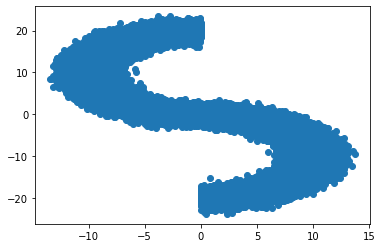

In [3]:
import matplotlib.pyplot as plt

test_images = Snake().data
plt.scatter(test_images[:,0], test_images[:,1])
plt.show()